In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Importing models form sklearn

In [2]:
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier

# Model Evaluations
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn.metrics import confusion_matrix,classification_report
from sklearn.metrics import precision_score,recall_score,f1_score
from sklearn.metrics import roc_curve

# Loaading the data

In [3]:
df = pd.read_csv("heart-disease.csv")
df.shape

(303, 14)

In [4]:
df.head()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,63,1,3,145,233,1,0,150,0,2.3,0,0,1,1
1,37,1,2,130,250,0,1,187,0,3.5,0,0,2,1
2,41,0,1,130,204,0,0,172,0,1.4,2,0,2,1
3,56,1,1,120,236,0,1,178,0,0.8,2,0,2,1
4,57,0,0,120,354,0,1,163,1,0.6,2,0,2,1


In [5]:
df.tail()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
298,57,0,0,140,241,0,1,123,1,0.2,1,0,3,0
299,45,1,3,110,264,0,1,132,0,1.2,1,0,3,0
300,68,1,0,144,193,1,1,141,0,3.4,1,2,3,0
301,57,1,0,130,131,0,1,115,1,1.2,1,1,3,0
302,57,0,1,130,236,0,0,174,0,0.0,1,1,2,0


In [6]:
df["target"].value_counts

<bound method IndexOpsMixin.value_counts of 0      1
1      1
2      1
3      1
4      1
      ..
298    0
299    0
300    0
301    0
302    0
Name: target, Length: 303, dtype: int64>

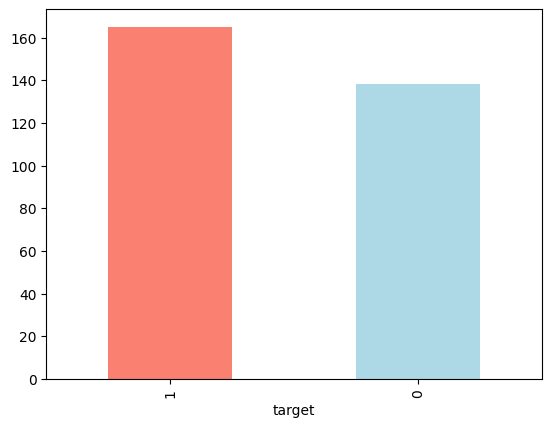

In [7]:
df["target"].value_counts().plot(kind="bar", color=('salmon','lightblue'));

In [8]:
df.isna().sum()

age         0
sex         0
cp          0
trestbps    0
chol        0
fbs         0
restecg     0
thalach     0
exang       0
oldpeak     0
slope       0
ca          0
thal        0
target      0
dtype: int64

In [9]:
df.describe()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
count,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000
mean,54.366337,0.683168,0.966997,131.623762,246.264026,0.148515,0.528053,149.646865,0.326733,1.039604,1.399340,0.729373,2.313531,0.544554
std,9.082101,0.466011,1.032052,17.538143,51.830751,0.356198,0.525860,22.905161,0.469794,1.161075,0.616226,1.022606,0.612277,0.498835
min,29.000000,0.000000,0.000000,94.000000,126.000000,0.000000,0.000000,71.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,47.500000,0.000000,0.000000,120.000000,211.000000,0.000000,0.000000,133.500000,0.000000,0.000000,1.000000,0.000000,2.000000,0.000000
50%,55.000000,1.000000,1.000000,130.000000,240.000000,0.000000,1.000000,153.000000,0.000000,0.800000,1.000000,0.000000,2.000000,1.000000
75%,61.000000,1.000000,2.000000,140.000000,274.500000,0.000000,1.000000,166.000000,1.000000,1.600000,2.000000,1.000000,3.000000,1.000000
max,77.000000,1.000000,3.000000,200.000000,564.000000,1.000000,2.000000,202.000000,1.000000,6.200000,2.000000,4.000000,3.000000,1.000000


In [10]:
pd.crosstab(df.target, df.sex)

sex,0,1
target,,
0,24,114
1,72,93


In [11]:
pd.crosstab(df.target, df.age)

age,29,34,35,37,38,39,40,41,42,43,...,65,66,67,68,69,70,71,74,76,77
target,,,,,,,,,,,,,,,,,,,,,
0,0,0,2,0,1,1,2,1,1,3,...,4,3,6,2,1,3,0,0,0,1
1,1,2,2,2,2,3,1,9,7,5,...,4,4,3,2,2,1,3,1,1,0


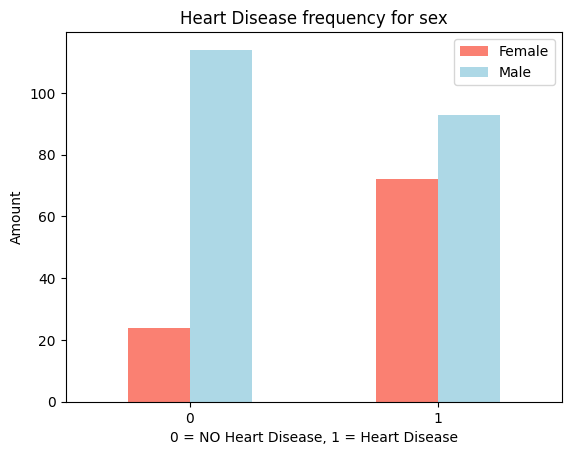

In [12]:
pd.crosstab(df.target, df.sex).plot(kind = "bar", color=("salmon","lightblue"));
plt.title("Heart Disease frequency for sex");
plt.xlabel("0 = NO Heart Disease, 1 = Heart Disease");
plt.ylabel("Amount");
plt.legend(["Female","Male"]);
plt.xticks(rotation = 0);

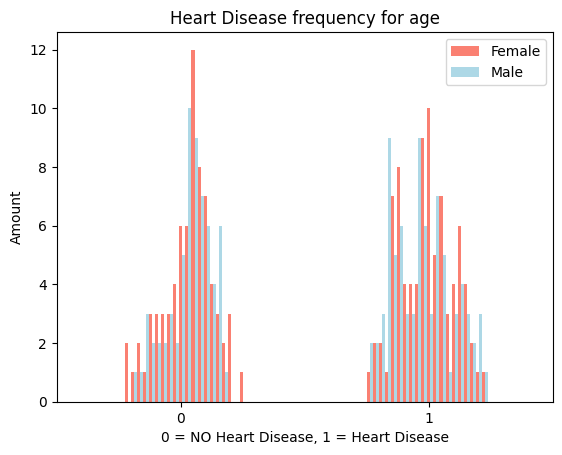

In [13]:
pd.crosstab(df.target, df.age).plot(kind = "bar", color=("salmon","lightblue"));
plt.title("Heart Disease frequency for age");
plt.xlabel("0 = NO Heart Disease, 1 = Heart Disease");
plt.ylabel("Amount");
plt.legend(["Female","Male"]);
plt.xticks(rotation = 0);

# Age vs max heart rate for Heart Disease

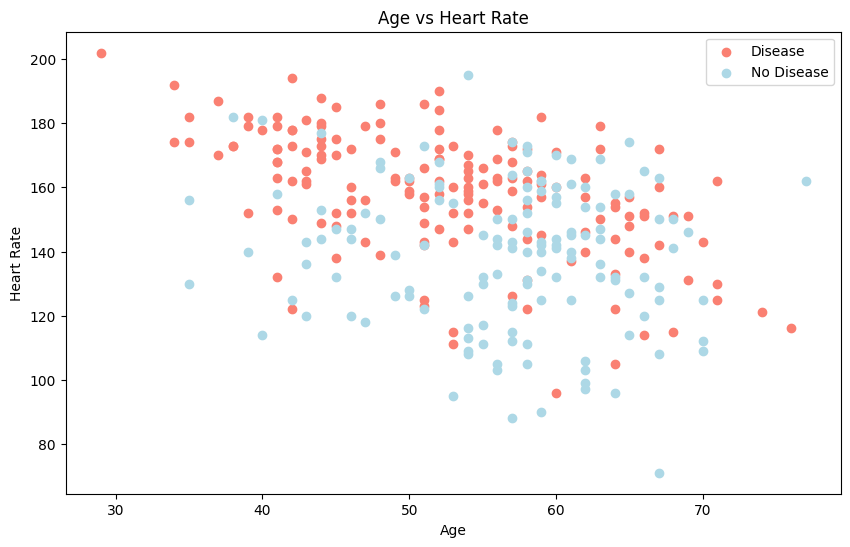

In [14]:
plt.figure(figsize = (10,6))

#scatter with positive examples
plt.scatter(df.age[df.target==1],
            df.thalach[df.target==1],
           c="salmon");
plt.scatter(df.age[df.target==0],
            df.thalach[df.target==0],
           c="lightblue");

plt.title("Age vs Heart Rate");
plt.xlabel("Age");
plt.ylabel("Heart Rate");
plt.legend(["Disease","No Disease"]);

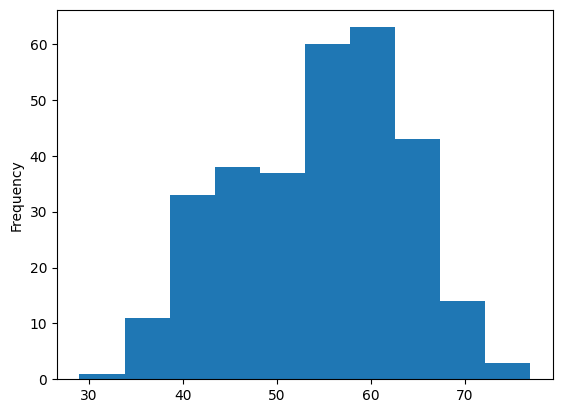

In [15]:
df.age.plot.hist();

In [16]:
df.corr()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
age,1.000000,-0.098447,-0.068653,0.279351,0.213678,0.121308,-0.116211,-0.398522,0.096801,0.210013,-0.168814,0.276326,0.068001,-0.225439
sex,-0.098447,1.000000,-0.049353,-0.056769,-0.197912,0.045032,-0.058196,-0.044020,0.141664,0.096093,-0.030711,0.118261,0.210041,-0.280937
cp,-0.068653,-0.049353,1.000000,0.047608,-0.076904,0.094444,0.044421,0.295762,-0.394280,-0.149230,0.119717,-0.181053,-0.161736,0.433798
trestbps,0.279351,-0.056769,0.047608,1.000000,0.123174,0.177531,-0.114103,-0.046698,0.067616,0.193216,-0.121475,0.101389,0.062210,-0.144931
chol,0.213678,-0.197912,-0.076904,0.123174,1.000000,0.013294,-0.151040,-0.009940,0.067023,0.053952,-0.004038,0.070511,0.098803,-0.085239
fbs,0.121308,0.045032,0.094444,0.177531,0.013294,1.000000,-0.084189,-0.008567,0.025665,0.005747,-0.059894,0.137979,-0.032019,-0.028046
restecg,-0.116211,-0.058196,0.044421,-0.114103,-0.151040,-0.084189,1.000000,0.044123,-0.070733,-0.058770,0.093045,-0.072042,-0.011981,0.137230
thalach,-0.398522,-0.044020,0.295762,-0.046698,-0.009940,-0.008567,0.044123,1.000000,-0.378812,-0.344187,0.386784,-0.213177,-0.096439,0.421741
exang,0.096801,0.141664,-0.394280,0.067616,0.067023,0.025665,-0.070733,-0.378812,1.000000,0.288223,-0.257748,0.115739,0.206754,-0.436757
oldpeak,0.210013,0.096093,-0.149230,0.193216,0.053952,0.005747,-0.058770,-0.344187,0.288223,1.000000,-0.577537,0.222682,0.210244,-0.430696


# Making the correlation matrix prettier

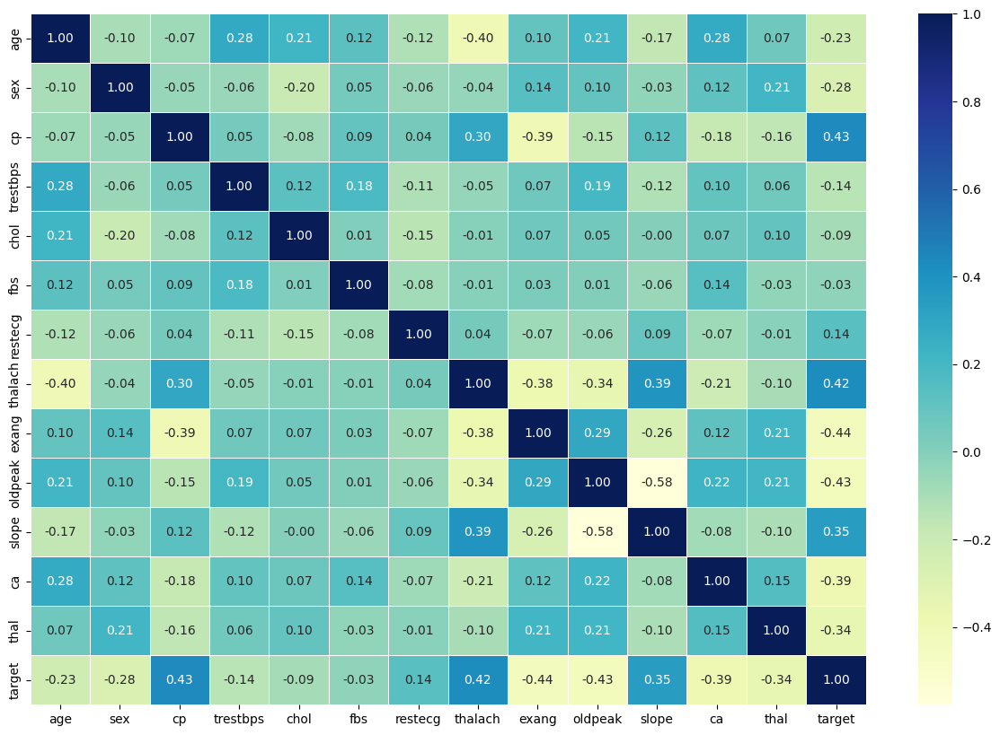

In [17]:
corr_mertix = df.corr()
fig, ax = plt.subplots(figsize=(15,10))
ax = sns.heatmap(corr_mertix,
                 annot=True,
                 linewidths=0.5,
                 fmt=".2f",
                 cmap="YlGnBu");
# bottom,top=ax.get_ylim()
# ax.set-ylim()

# preparing Our data for Machine Learning

In [18]:
np.random.seed(42)

In [19]:
x = df.drop("target", axis = 1)
y = df["target"]

In [20]:
x_train,x_test,y_train,y_test = train_test_split(x,
                                                 y,
                                                 test_size=0.2)

In [21]:
x_train.shape

(242, 13)

In [22]:
x_test.shape

(61, 13)

In [23]:
y_train.shape

(242,)

In [24]:
y_test.shape

(61,)

In [25]:
models = {"Logistic Regressor " : LogisticRegression(),
         "KNN " : KNeighborsClassifier(),
         "Randoem Forest" : RandomForestClassifier()}

# Creating a function to fit and scroe the model
def fit_and_score(models,x_train,x_test,y_train,y_test):
    np.random.seed(42)
    # Make a dictionary to store the model scores
    model_scores={}
    # 
    for name,model in models.items():
        # fit the model to the data
        model.fit(x_train,y_train)
        # Evaluate the model and store it to the model_scores
        model_scores[name]=model.score(x_test,y_test)
    return model_scores
    
model_scores = fit_and_score(models,
                             x_train,
                             x_test,
                             y_train,
                             y_test)

model_scores

/opt/anaconda3/envs/env/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


{'Logistic Regressor ': 0.8852459016393442,
 'KNN ': 0.6885245901639344,
 'Randoem Forest': 0.8360655737704918}

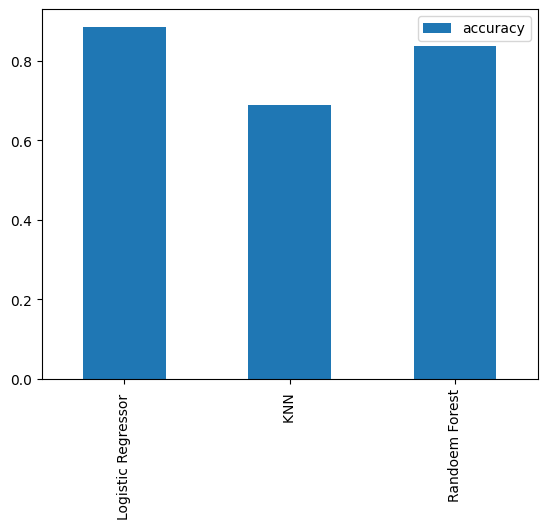

In [26]:
model_compare = pd.DataFrame(model_scores,index=["accuracy"])
model_compare.T.plot.bar();

In [27]:
# Let's tune KNN
train_scores = []
test_scores  = []

# create a lsit of differenet values of n neighbors
neighbors =range(1,21)

# set up KNN instance
knn = KNeighborsClassifier()

# loop throgh different n_neighbors
for i in neighbors:
    knn.set_params(n_neighbors=i)
    # fit the algorithm
    knn.fit(x_train,y_train)
    # updtate the training score list
    train_scores.append(knn.score(x_train,y_train))
    # update the test scores list
    test_scores.append(knn.score(x_test,y_test))

In [28]:
train_scores

[1.0,
 0.8099173553719008,
 0.7727272727272727,
 0.743801652892562,
 0.7603305785123967,
 0.7520661157024794,
 0.743801652892562,
 0.7231404958677686,
 0.71900826446281,
 0.6942148760330579,
 0.7272727272727273,
 0.6983471074380165,
 0.6900826446280992,
 0.6942148760330579,
 0.6859504132231405,
 0.6735537190082644,
 0.6859504132231405,
 0.6652892561983471,
 0.6818181818181818,
 0.6694214876033058]

In [29]:
test_scores

[0.6229508196721312,
 0.639344262295082,
 0.6557377049180327,
 0.6721311475409836,
 0.6885245901639344,
 0.7213114754098361,
 0.7049180327868853,
 0.6885245901639344,
 0.6885245901639344,
 0.7049180327868853,
 0.7540983606557377,
 0.7377049180327869,
 0.7377049180327869,
 0.7377049180327869,
 0.6885245901639344,
 0.7213114754098361,
 0.6885245901639344,
 0.6885245901639344,
 0.7049180327868853,
 0.6557377049180327]

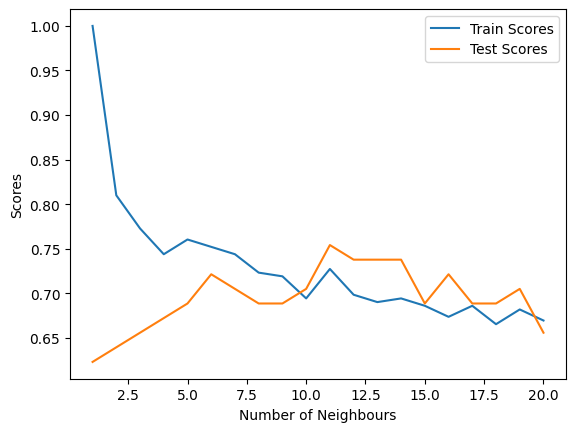

In [30]:
plt.plot(neighbors,train_scores,label="Train Scores");
plt.plot(neighbors,test_scores,label="Test Scores");
plt.xlabel("Number of Neighbours");
plt.ylabel("Scores");
plt.legend()

In [31]:
# Creating a hyperparameter grid for LogisticRegression
log_reg_grid = {"C": np.logspace(-4, 4, 20),
                "solver": ["liblinear"]} 

# Creating a hyperparameter grid for RandomForestClassifier
rf_grid = {"n_estimators": np.arange(10, 1000, 50),
            "max_depth": [None, 3, 5, 10],
            "min_samples_split": np.arange(2, 20, 2),
            "min_samples_leaf": np.arange(1, 20, 2)}

In [32]:
# setup Random hyperparameter search for the LogisticRegressor
log_reg_grid = RandomizedSearchCV(LogisticRegression(),
                                  param_distributions=log_reg_grid,
                                  cv=5,
                                  n_iter=20,
                                  verbose=True)

In [33]:
log_reg_grid.fit(x_train, y_train)

Fitting 5 folds for each of 20 candidates, totalling 100 fits


RandomizedSearchCV(cv=5, estimator=LogisticRegression(), n_iter=20,
                   param_distributions={'C': array([1.00000000e-04, 2.63665090e-04, 6.95192796e-04, 1.83298071e-03,
       4.83293024e-03, 1.27427499e-02, 3.35981829e-02, 8.85866790e-02,
       2.33572147e-01, 6.15848211e-01, 1.62377674e+00, 4.28133240e+00,
       1.12883789e+01, 2.97635144e+01, 7.84759970e+01, 2.06913808e+02,
       5.45559478e+02, 1.43844989e+03, 3.79269019e+03, 1.00000000e+04]),
                                        'solver': ['liblinear']},
                   verbose=True)

In [34]:
log_reg_grid.score(x_test, y_test)

0.8852459016393442

In [35]:
# Set up random seed
np.random.seed(42)

# set up Random Hyperparameter for the RandomForestClassifier
rf_grid = RandomizedSearchCV(RandomForestClassifier(),
                            param_distributions=rf_grid,
                            cv=5,
                            n_iter=20,
                            verbose=True)

In [36]:
rf_grid.fit(x_train, y_train)

Fitting 5 folds for each of 20 candidates, totalling 100 fits


RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(), n_iter=20,
                   param_distributions={'max_depth': [None, 3, 5, 10],
                                        'min_samples_leaf': array([ 1,  3,  5,  7,  9, 11, 13, 15, 17, 19]),
                                        'min_samples_split': array([ 2,  4,  6,  8, 10, 12, 14, 16, 18]),
                                        'n_estimators': array([ 10,  60, 110, 160, 210, 260, 310, 360, 410, 460, 510, 560, 610,
       660, 710, 760, 810, 860, 910, 960])},
                   verbose=True)

In [37]:
rf_grid.score(x_test, y_test)

0.8688524590163934

In [38]:
rf_grid.best_params_

{'n_estimators': 210,
 'min_samples_split': 4,
 'min_samples_leaf': 19,
 'max_depth': 3}

In [44]:
log_reg_grid_1 = {
    "C": np.logspace(-4, 4, 20),  # Regularisation strength
    "solver": ["liblinear", "lbfgs", "newton-cg", "saga"],  # Optimisation solvers
    "penalty": ["l1", "l2", "elasticnet", "none"],  # Regularisation types
    "class_weight": [None, "balanced"],  # Handle imbalanced datasets
    "max_iter": [100, 200, 500],  # Number of iterations for convergence
    "l1_ratio": np.linspace(0, 1, 10)  # ElasticNet mixing parameter (if using elasticnet penalty)
}

In [48]:
log_reg_grid = {"C": np.logspace(-4,4,30),
               "solver":["liblinear"]}

gs_log_reg = GridSearchCV(LogisticRegression(),
                         param_grid=log_reg_grid,
                         cv=5,
                         verbose=True)

In [49]:
gs_log_reg.fit(x_train, y_train)

Fitting 5 folds for each of 30 candidates, totalling 150 fits


GridSearchCV(cv=5, estimator=LogisticRegression(),
             param_grid={'C': array([1.00000000e-04, 1.88739182e-04, 3.56224789e-04, 6.72335754e-04,
       1.26896100e-03, 2.39502662e-03, 4.52035366e-03, 8.53167852e-03,
       1.61026203e-02, 3.03919538e-02, 5.73615251e-02, 1.08263673e-01,
       2.04335972e-01, 3.85662042e-01, 7.27895384e-01, 1.37382380e+00,
       2.59294380e+00, 4.89390092e+00, 9.23670857e+00, 1.74332882e+01,
       3.29034456e+01, 6.21016942e+01, 1.17210230e+02, 2.21221629e+02,
       4.17531894e+02, 7.88046282e+02, 1.48735211e+03, 2.80721620e+03,
       5.29831691e+03, 1.00000000e+04]),
                         'solver': ['liblinear']},
             verbose=True)

In [50]:
gs_log_reg.score(x_test, y_test)

0.8852459016393442

In [51]:
gs_log_reg.best_params_

{'C': 0.20433597178569418, 'solver': 'liblinear'}

In [52]:
y_preds = gs_log_reg.predict(x_test)

In [53]:
y_preds

array([0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0,
       0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0])

In [54]:
y_test

179    0
228    0
111    1
246    0
60     1
      ..
249    0
104    1
300    0
193    0
184    0
Name: target, Length: 61, dtype: int64

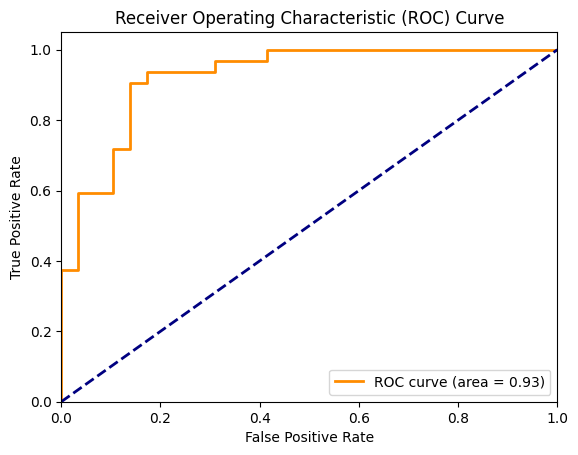

In [55]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# Assuming you have already trained your model gs_log_reg and have x_test, y_test

# Get the predicted probabilities for the positive class
y_probs = gs_log_reg.predict_proba(x_test)[:, 1]

# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_probs)

# Compute AUC (Area Under the Curve)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

In [56]:
print(confusion_matrix(y_test,y_preds))

[[25  4]
 [ 3 29]]


In [57]:
# Confusion Matrix using seadorn
sns

<module 'seaborn' from '/opt/anaconda3/envs/env/lib/python3.12/site-packages/seaborn/__init__.py'>

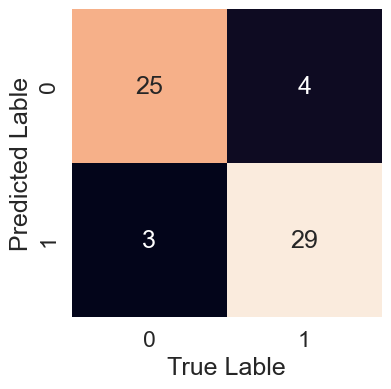

In [58]:
sns.set(font_scale = 1.5)
def plot_conf_matrix(y_test,y_preds):
    """
    plot a nice looking confusion matrix using Seaborn's heatmap()
    """
    fig,ax=plt.subplots(figsize=(4,4))
    ax = sns.heatmap(confusion_matrix(y_test,y_preds),
                    annot=True,
                    cbar=False)
    plt.xlabel("True Lable")
    plt.ylabel("Predicted Lable")
    bottom,top = ax.get_ylim()
    # ax.set_ylim(bottom+0.5,top-0.5)

plot_conf_matrix(y_test,y_preds)

In [59]:
print(classification_report(y_test,y_preds))

              precision    recall  f1-score   support

           0       0.89      0.86      0.88        29
           1       0.88      0.91      0.89        32

    accuracy                           0.89        61
   macro avg       0.89      0.88      0.88        61
weighted avg       0.89      0.89      0.89        61



In [60]:
param_grid = {
    'n_estimators': [100, 200, 300, 400, 500,1000],  # Number of trees
    'max_depth': [10, 20, 30, 40, 50, None],    # Maximum depth of trees
    'min_samples_split': [2, 5, 10],            # Minimum number of samples to split a node
    'min_samples_leaf': [1, 2, 4],              # Minimum number of samples at a leaf node
    'max_features': ['auto', 'sqrt'],           # Number of features to consider when splitting
    'bootstrap': [True, False]                  # Whether to use bootstrap sampling
}

In [61]:
param_grid = RandomizedSearchCV(estimator=RandomForestClassifier(),
                               param_distributions=param_grid,
                               n_iter=100,
                               cv=10,
                               verbose=2,
                               n_jobs=1,
                               random_state=42)

In [62]:
param_grid.fit(x_test, y_test)

Fitting 10 folds for each of 100 candidates, totalling 1000 fits
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   0.4s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   0.3s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   0.3s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   0.3s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   0.3s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   0.3s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_esti

/opt/anaconda3/envs/env/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
420 fits failed out of a total of 1000.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
420 fits failed with the following error:
Traceback (most recent call last):
  File "/opt/anaconda3/envs/env/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/env/lib/python3.12/site-packages/sklearn/base.py", line 1466, in wrapper
    estimator._validate_params()
  File "/opt/anaconda3/envs/env/lib/python3.12/site-packages/sklearn/base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File 

RandomizedSearchCV(cv=10, estimator=RandomForestClassifier(), n_iter=100,
                   n_jobs=1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [10, 20, 30, 40, 50, None],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [100, 200, 300, 400,
                                                         500, 1000]},
                   random_state=42, verbose=2)

In [63]:
param_grid.score(x_test, y_test)

0.9016393442622951

In [64]:
y_preds_1 = param_grid.predict(x_test)

In [65]:
y_preds_1

array([0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0,
       0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0])

In [66]:
from sklearn.metrics import accuracy_score

In [67]:
print(classification_report(y_test,y_preds_1))

              precision    recall  f1-score   support

           0       0.93      0.86      0.89        29
           1       0.88      0.94      0.91        32

    accuracy                           0.90        61
   macro avg       0.90      0.90      0.90        61
weighted avg       0.90      0.90      0.90        61



In [68]:
accuracy = accuracy_score(y_test, y_preds_1)
print(f'Accuracy: {accuracy * 100:.2f}%')

Accuracy: 90.16%


In [69]:
conf_matrix = confusion_matrix(y_test, y_preds_1)
print('Confusion Matrix:\n', conf_matrix)

Confusion Matrix:
 [[25  4]
 [ 2 30]]


In [70]:
param_grid.best_params_

{'n_estimators': 1000,
 'min_samples_split': 5,
 'min_samples_leaf': 4,
 'max_features': 'sqrt',
 'max_depth': 40,
 'bootstrap': True}

In [71]:
rf_grid = {
    "n_estimators": np.arange(50, 1001, 50),  # Number of trees in the forest
    "max_depth": [None, 5, 10, 15, 20],  # Depth of each tree
    "min_samples_split": np.arange(2, 21, 2),  # Minimum samples required to split a node
    "min_samples_leaf": np.arange(1, 21, 2),  # Minimum samples required at a leaf node
    "max_features": ["sqrt", "log2", None],  # Number of features to consider at each split
    "bootstrap": [True, False],  # Whether to use bootstrap samples
    "criterion": ["gini", "entropy", "log_loss"],  # Measure of split quality
    "max_leaf_nodes": [None, 10, 20, 50, 100],  # Maximum number of leaf nodes
    "class_weight": [None, "balanced", "balanced_subsample"]  # Handle class imbalance
}

In [72]:
grid_search = GridSearchCV(RandomForestClassifier(),
                          param_grid=rf_grid,
                          cv=5,
                          verbose=2,
                          n_jobs=-1)

In [ ]:
grid_search.fit(x_test, y_test)

Fitting 5 folds for each of 2700000 candidates, totalling 13500000 fits
[CV] END bootstrap=True, class_weight=None, criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.0s
[CV] END bootstrap=True, class_weight=None, criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, class_weight=None, criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_samples_split=2, n_estimators=250; total time=   0.2s
[CV] END bootstrap=True, class_weight=None, criterion=gini, max_depth=None, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_samples_split

In [124]:
grid_search.score(x_test, y_test)

0.8852459016393442

In [125]:
y_preds_2 = grid_search.predict(x_test)
y_preds_2

array([0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0,
       1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0])

In [129]:
accuracy = accuracy_score(y_test, y_preds_2)
print(f'Accuracy: {accuracy * 100:.2f}%')

Accuracy: 88.52%


In [130]:
conf_matrix = confusion_matrix(y_test, y_preds_1)
print('Confusion Matrix:\n', conf_matrix)

Confusion Matrix:
 [[25  4]
 [ 2 30]]


In [132]:
pip install optuna

Note: you may need to restart the kernel to use updated packages.


In [133]:
import optuna
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.datasets import load_breast_cancer
from sklearn.metrics import accuracy_score

In [145]:
# Split the dataset into training and testing sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.25, random_state=42)

In [146]:
# Define the objective function for Optuna
def objective(trial):
    # Suggest hyperparameters to optimize
    n_estimators = trial.suggest_int('n_estimators', 50, 300)
    max_depth = trial.suggest_int('max_depth', 2, 32)
    min_samples_split = trial.suggest_int('min_samples_split', 2, 10)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 10)
    
    # Create the RandomForestClassifier with suggested hyperparameters
    clf = RandomForestClassifier(
        n_estimators=n_estimators,
        max_depth=max_depth,
        min_samples_split=min_samples_split,
        min_samples_leaf=min_samples_leaf,
        random_state=42
    )
    
    # Perform cross-validation and return the accuracy score
    score = cross_val_score(clf, x_train, y_train, n_jobs=-1, cv=3)
    accuracy = score.mean()
    
    return accuracy

In [147]:
# Create an Optuna study to optimize the objective function
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials= 2000)

[I 2024-12-05 00:55:43,926] A new study created in memory with name: no-name-1c544ee6-187a-4b11-bf9f-98381838734f
[I 2024-12-05 00:55:44,127] Trial 0 finished with value: 0.819356725146199 and parameters: {'n_estimators': 224, 'max_depth': 28, 'min_samples_split': 5, 'min_samples_leaf': 10}. Best is trial 0 with value: 0.819356725146199.
[I 2024-12-05 00:55:44,317] Trial 1 finished with value: 0.8192982456140351 and parameters: {'n_estimators': 248, 'max_depth': 29, 'min_samples_split': 4, 'min_samples_leaf': 7}. Best is trial 0 with value: 0.819356725146199.
[I 2024-12-05 00:55:44,404] Trial 2 finished with value: 0.8195321637426901 and parameters: {'n_estimators': 97, 'max_depth': 20, 'min_samples_split': 7, 'min_samples_leaf': 2}. Best is trial 2 with value: 0.8195321637426901.
[I 2024-12-05 00:55:44,614] Trial 3 finished with value: 0.8105847953216374 and parameters: {'n_estimators': 258, 'max_depth': 16, 'min_samples_split': 8, 'min_samples_leaf': 4}. Best is trial 2 with value: 0

In [148]:
# Get the best trial (best hyperparameters)
best_trial = study.best_trial

print(f"Best Accuracy: {best_trial.value}")
print("Best Hyperparameters:")
for key, value in best_trial.params.items():
    print(f"{key}: {value}")

Best Accuracy: 0.8416374269005847
Best Hyperparameters:
n_estimators: 83
max_depth: 12
min_samples_split: 5
min_samples_leaf: 2
